In [ ]:
import spatialdata as sd
import spatialdata_io
import spatialdata_plot
import sparrow as sp
from sparrow.io._visium_hd import visium_hd
from napari_spatialdata import Interactive
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import anndata as ad

# Import _rasterize_bins from ../utils/rasterize_bins.py
import sys
sys.path.append('../utils')
from rasterize_bins import _rasterize_bins

In [2]:
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

In [ ]:
sdata = sd.read_zarr('../data/Visium_HD_Liver/Visium_HD_Liver_zarr')

In [ ]:
adata = sdata.tables['square_008um_pp']
adata

AnnData object with n_obs × n_vars = 461427 × 17588
    obs: 'cell_ID', 'in_tissue', 'array_row', 'array_col', 'fov_labels', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts', 'clusters'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'clusters', 'clusters_colors', 'hvg', 'log1p', 'neighbors', 'pca', 'spatialdata_attrs', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

## Subclustering

Since each cluster seems to be only related to the zones and not cell types, we will try subclustering each zone to see whether we can get more structure. So using zonation marker genes, we will annotate each cluster with its zones (mid, central, periportal) using Sparrow's `score_genes` function.

In [ ]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")

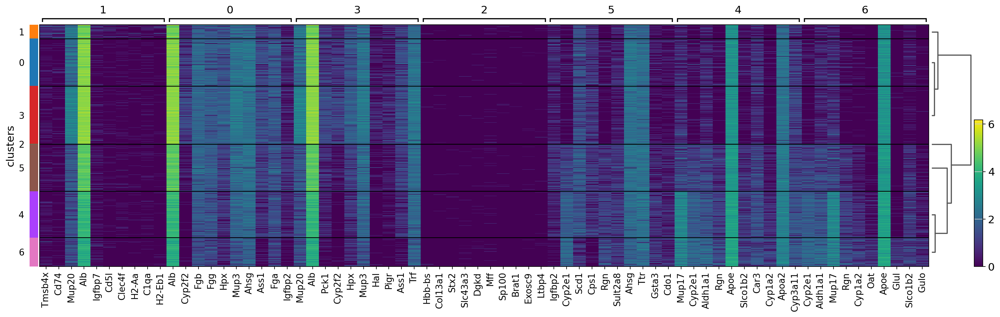

In [9]:
plt.rcParams["figure.figsize"] = (10, 10)
sc.pl.rank_genes_groups_heatmap(adata, n_genes=10, groupby="clusters", show_gene_labels=True)

In [ ]:
# Get zonation markers
zonation_marker_genes = pd.read_csv('../data/liver_marker_genes/final_MERscope_panel_Guilliams1.csv')

# Print the first few rows of the marker_genes dataframe
print(zonation_marker_genes.head())

# Check how many of the "Vizgen Gene" column values are in the adata.var_names
print("{} out of {} genes are in the AnnData".format(zonation_marker_genes['Vizgen Gene'].isin(adata.var_names).sum(), len(zonation_marker_genes)))

# Get value_counts of "Notes" column that starts with cellType_
print(zonation_marker_genes['Notes'][zonation_marker_genes['Notes'].str.startswith('zonation')].value_counts())

# Only get marker genes with cellType_ in the "Notes" column that has more than 10 genes
zonation_marker_genes_subset = zonation_marker_genes[zonation_marker_genes['Notes'].str.startswith('zonation')].copy()
print(zonation_marker_genes_subset)

  Gene Input Vizgen Gene         Ensemble ID          Transcript  \
0       NGFR        Ngfr  ENSMUSG00000000120  ENSMUST00000000122   
1       CCL2        Ccl2  ENSMUSG00000035385  ENSMUST00000000193   
2      CCL12       Ccl12  ENSMUSG00000035352  ENSMUST00000000194   
3         TH          Th  ENSMUSG00000000214  ENSMUST00000000219   
4       LHX2        Lhx2  ENSMUSG00000000247  ENSMUST00000000253   

                         Notes  Abundance  Target Regions     Type  
0     zonation_portal_stellate   0.633947             102  MERFISH  
1        partialHepatectomy_KC   1.699000              57  MERFISH  
2  partialHepatectomy_monocyte   0.084735              40  MERFISH  
3            neuron_adrenergic   0.027851              51  MERFISH  
4            cellType_stellate   0.532331              55  MERFISH  
951 out of 1000 genes are in the AnnData
Notes
zonation_portal_stellate       14
zonation_portal_hepatocyte     10
zonation_central_hepatocyte     8
zonation_central_LSEC       

In [ ]:
#only keep zonation_[a-zA-Z]_ str
zonation_marker_genes_subset['Notes'] = zonation_marker_genes_subset['Notes'].str.extract(r'zonation_([a-zA-Z]+)')

# Turn marker_gene_subset into a one-hot encoded dataframe, with cell type names in the first row, and marker genes in the columns
zonation_marker_genes_onehot = zonation_marker_genes_subset.pivot(index='Notes', columns='Vizgen Gene', values='Vizgen Gene').fillna(0)
# Turn string to 1
zonation_marker_genes_onehot = zonation_marker_genes_onehot.applymap(lambda x: 1 if x != 0 else 0)
# Remove "cellType_" from the index
zonation_marker_genes_onehot.index = zonation_marker_genes_onehot.index.str.replace('cellType_', '')
# Transpose this
zonation_marker_genes_onehot = zonation_marker_genes_onehot.T
zonation_marker_genes_onehot

/tmp/ipykernel_23353/1841502373.py:7: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  zonation_marker_genes_onehot = zonation_marker_genes_onehot.applymap(lambda x: 1 if x != 0 else 0)


Notes,central,notMid,portal
Vizgen Gene,,,
Abi3bp,0,0,1
Acot1,1,0,0
Adamtsl2,0,1,0
Adgrg6,0,0,1
Aldh1b1,0,0,1
Aldh3a2,1,0,0
Alox12,0,1,0
Ano1,0,0,1
Axin2,0,0,1


In [ ]:
labels_layer = "Visium_HD_Liver_square_008um_labels"
# Use sparrow.tb.score_genes to score the marker genes in the adata
sp.tb.score_genes(sdata, labels_layer=labels_layer, table_layer="square_008um", output_layer="square_008um_zonation_scores",
                       path_marker_genes=zonation_marker_genes_onehot, celltype_column='zonation')

In [27]:
adata = sdata.tables['square_008um_zonation_scores']

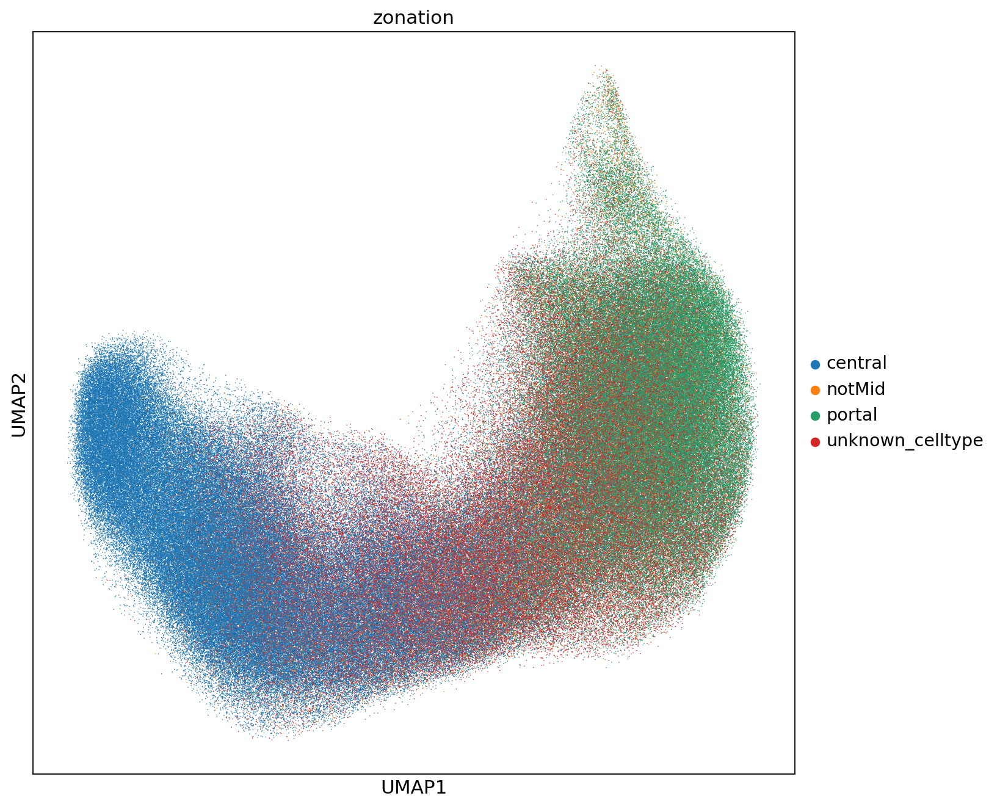

In [ ]:
sc.pl.umap(adata, color=["zonation"], s=2)

/tmp/ipykernel_34837/1782047189.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  sdata.tables[table_layer]


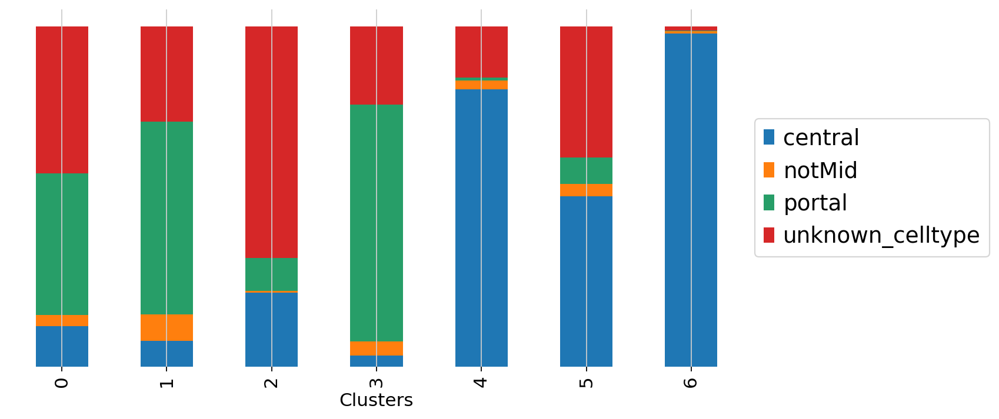

In [ ]:
celltype_column = "zonation"
table_layer = "square_008um_zonation_scores"
 stacked = (
        sdata.tables[table_layer]
        .obs.groupby(["clusters", celltype_column], as_index=False)
        .size()
        .pivot(index="clusters", columns=celltype_column)
        .fillna(0)
    )
stacked_norm = stacked.div(stacked.sum(axis=1), axis=0)
stacked_norm.columns = list(sdata.tables[table_layer].obs[celltype_column].cat.categories)
fig, ax = plt.subplots(1, 1, figsize=(10, 5))

stacked_norm.plot(kind="bar", stacked=True, ax=fig.gca())
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["bottom"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.get_yaxis().set_ticks([])
plt.xlabel("Clusters")
plt.legend(loc="center left", bbox_to_anchor=(1.0, 0.5), fontsize="large")

Let's try subclustering cluster 6 = central cells.

In [10]:
adata = ad.read_zarr("/home/chananchidas/visium-hd/data/Visium_HD_Liver/Visium_HD_Liver_zarr/tables/square_008um")

In [11]:
# Subset only cluster 6
adata_subset = adata[adata.obs["clusters"] == "6"].copy()

In [30]:
# Find new HVGs
sc.pp.highly_variable_genes(adata_subset, flavor="seurat", n_top_genes=500)


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [59]:
sc.pp.pca(adata_subset)
sc.pp.neighbors(adata_subset, n_pcs=35, n_neighbors=5)
sc.tl.umap(adata_subset, min_dist=0.2, spread=0.5)
sc.tl.leiden(
    adata_subset, key_added="clusters6", resolution=0.8, flavor="igraph", directed=False, n_iterations=2
)

computing PCA
    with n_comps=50
    finished (0:00:00)
computing neighbors
    using 'X_pca' with n_pcs = 35


/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/scipy/sparse/_index.py:145: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:18)
running Leiden clustering
    finished: found 30 clusters and added
    'clusters6', the cluster labels (adata.obs, categorical) (0:00:00)


In [60]:
sc.tl.leiden(
    adata_subset, key_added="clusters6", resolution=0.2, flavor="igraph", directed=False, n_iterations=2
)

running Leiden clustering
    finished: found 7 clusters and added
    'clusters6', the cluster labels (adata.obs, categorical) (0:00:00)


In [56]:
del adata_subset.uns['clusters6_colors']

In [61]:
adata_subset.obs["clusters6"].value_counts()

clusters6
0    32488
1    20305
2     1769
3      321
4       22
5       17
6        8
Name: count, dtype: int64

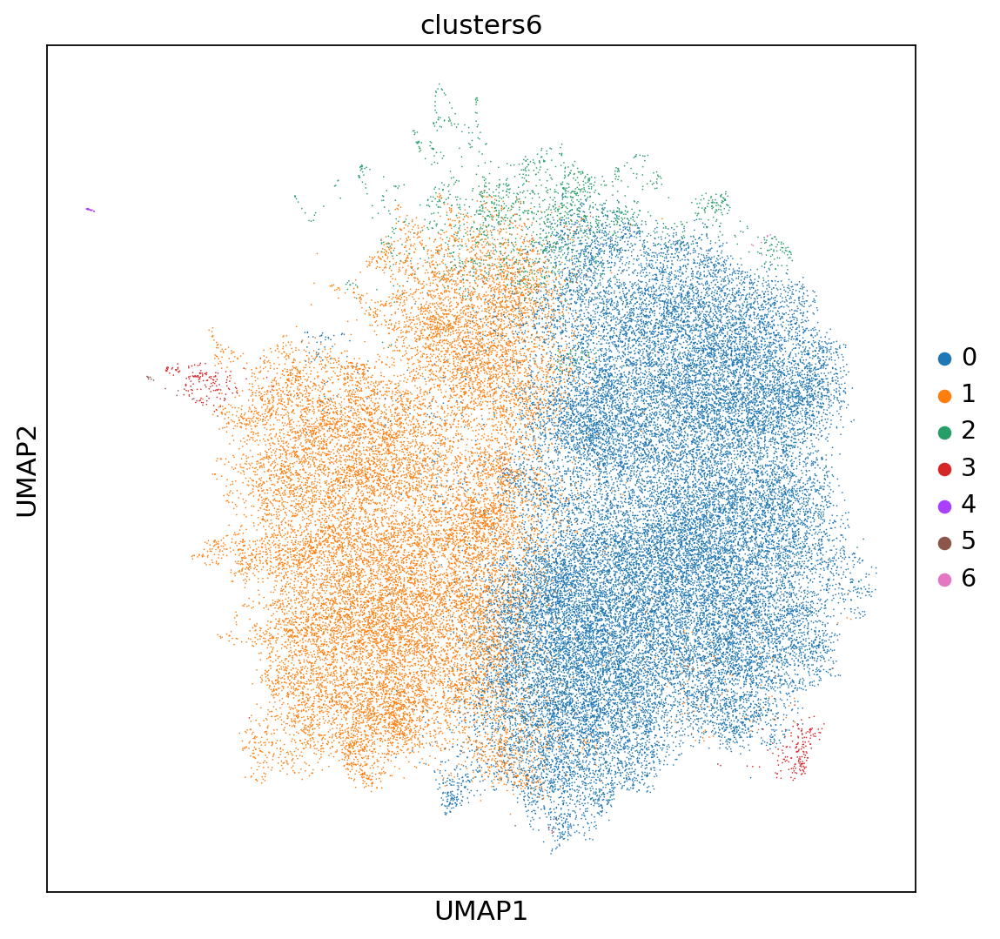

In [62]:
# Add color
sc.pl.umap(adata_subset, color=["clusters6"], wspace=0.4)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters6']`
categories: 0, 1, 2, etc.
var_group_labels: 0, 1


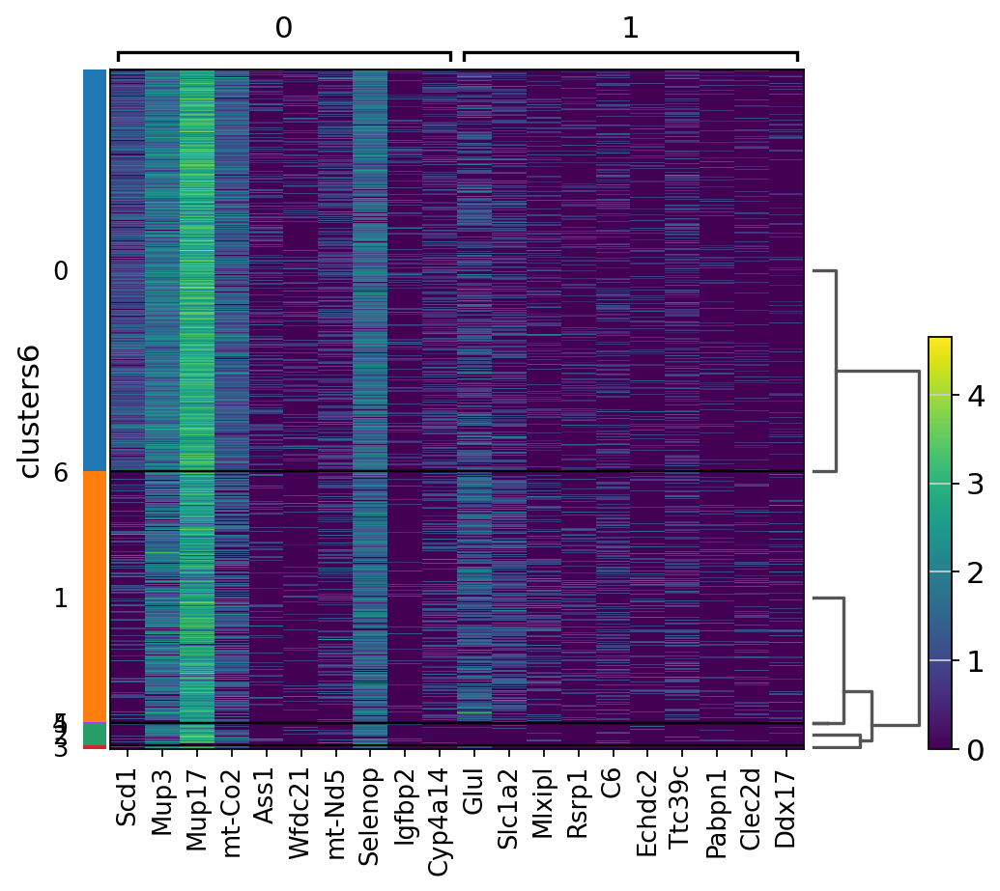

In [63]:
# Get marker genes of the clusters
sc.tl.rank_genes_groups(adata_subset, "clusters6", method="t-test")

sc.pl.rank_genes_groups_heatmap(adata_subset, n_genes=10, groups=["0", "1"], show_gene_labels=True)

In [ ]:
sc.tl.leiden(adata, restrict_to=("clusters", ["6"]), key_added="cluster6")

running Leiden clustering


/tmp/ipykernel_43262/2981574923.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, restrict_to=("clusters", ["6"]), key_added="cluster6")


    finished: found 17 clusters and added
    'cluster6', the cluster labels (adata.obs, categorical) (0:00:55)


In [29]:
adata.obs["cluster6"].value_counts()

cluster6
3       110655
0        90339
5        89794
4        88450
1        27102
6,0      11421
6,1      10900
6,2       9375
6,3       8787
6,4       4724
6,5       3101
6,6       2794
6,7       1960
6,8       1214
6,9        651
2          157
6,10         3
Name: count, dtype: int64

## Visualization in spatial coordinates

In [47]:
# Subset only cluster 6
adata_cluster6 = adata[adata.obs["clusters"] == "6"].copy()

In [48]:
sdata["adata_cluster6"] = adata_cluster6

In [4]:
labels_layer = "Visium_HD_Liver_square_008um_labels"

I think the subclusters are still influenced by zonation.

2025-02-04 11:55:16,631 - sparrow.plot._plot - WARNING - There are '63072' cells in provided shapes_layer 'Visium_HD_Liver_square_008um' not found in 'sdata.tables[adata_cluster6]' (linked through 'cell_ID'), these cells will not be plotted.


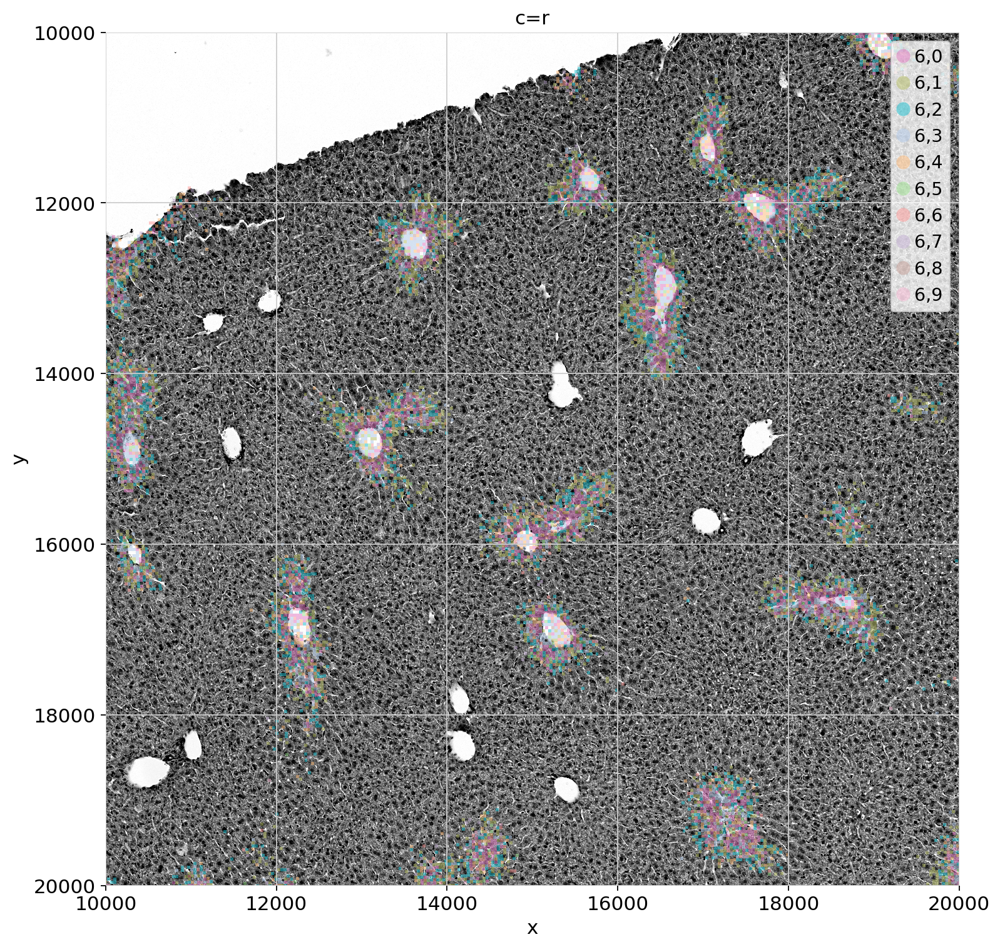

In [ ]:
sp.pl.plot_shapes(sdata,
                  shapes_layer= "Visium_HD_Liver_square_008um",
                  #labels_layer="Visium_HD_Liver_square_008um_labels",
                  img_layer="Visium_HD_Liver_full_image",
                  crd =[10000, 20000, 10000, 20000],
                  channel="r",
                  figsize=(10,10),
                  linewidth=0,
                  column= "cluster6",
                  table_layer="adata_cluster6",
                    )

In [52]:
# Write adata_cluster6
sdata["table_008um_cluster6"] = adata_cluster6 
sdata.write_element("table_008um_cluster6")

/home/chananchidas/miniconda3/envs/harpy2/lib/python3.10/site-packages/spatialdata/_core/_elements.py:116: UserWarning: Key `table_008um_cluster6` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
